In [1]:
from IPython.display import clear_output
from time import sleep

import numpy as np
import pandas as pd
from scipy.linalg import null_space, qr
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import expm_multiply
import matplotlib as mpl
import matplotlib.pyplot as plt
import networkx as nx
import pyvis.network as nt
import igraph

from qlinks.lattice.square_lattice import SquareLattice
from qlinks.symmetry.gauss_law import GaussLaw
from qlinks.solver.deep_first_search import DeepFirstSearch
from qlinks.computation_basis import ComputationBasis
from qlinks.model import QuantumLinkModel
from qlinks.visualizer.graph import GraphVisualizer

np.set_printoptions(threshold=np.inf)
pd.set_option('display.max_rows', None)

In [2]:
def format_custom_index(index):
    return [f"({i}) {idx}" for i, idx in enumerate(index)]

def setup_dimer_model(lattice_shape, n_solution, coup_j, coup_rk):
    gauss_law = GaussLaw.from_staggered_charge_distri(*lattice_shape)
    gauss_law.flux_sector = (0, 0)
    dfs = DeepFirstSearch(gauss_law, max_steps=int(1e+8))
    basis = gauss_law.to_basis(dfs.solve(n_solution))
    model = QuantumLinkModel(coup_j, coup_rk, lattice_shape, basis)
    return basis, model

def setup_link_model(lattice_shape, n_solution, coup_j, coup_rk):
    gauss_law = GaussLaw.from_zero_charge_distri(*lattice_shape)
    gauss_law.flux_sector = (0, 0)
    dfs = DeepFirstSearch(gauss_law, max_steps=int(1e+8))
    basis = gauss_law.to_basis(dfs.solve(n_solution))
    model = QuantumLinkModel(coup_j, coup_rk, lattice_shape, basis)
    return basis, model

def qr_null(mat, tol=None):
    Q, R, P = qr(mat.T, mode="full", pivoting=True)
    tol = np.finfo(R.dtype).eps if tol is None else tol
    rnk = min(mat.shape) - np.abs(np.diag(R))[::-1].searchsorted(tol)
    return Q[:, rnk:].conj()

In [3]:
coup_j, coup_rk = (-1, 0)
basis, model = setup_link_model(lattice_shape=(2, 2), n_solution=6, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian.toarray())

2024-04-18 23:06:16 [deep_first_search.py] INFO: Deep First Search starts.
2024-04-18 23:06:17 [deep_first_search.py] INFO: No more new Solutions can be found, end up with 6 Solutions in 20 steps.


In [4]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df

,eval,kin,pot
0,-2.828427e+00,-2.828427e+00,3.0
1,-1.619402e-16,0.000000e+00,2.0
2,-2.189529e-47,-6.842278e-48,2.0
3,3.330669e-16,7.395571e-32,4.0
4,5.254448e-16,-1.848893e-32,2.0
5,2.828427e+00,2.828427e+00,3.0


# QDM Lattice 4x2

In [11]:
coup_j, coup_rk = (-1, 0)
basis, model = setup_dimer_model(lattice_shape=(4, 2), n_solution=16, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian.toarray())

2024-04-17 21:59:34 [deep_first_search.py] INFO: Deep First Search starts.
2024-04-17 21:59:34 [deep_first_search.py] INFO: No more new Solutions can be found, end up with 16 Solutions in 104 steps.


In [12]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
(0) 17595,0,1,0,0,0,1,0,0,1,0,1,1,1,0,1,1
(1) 18867,0,1,0,0,1,0,0,1,1,0,1,1,0,0,1,1
(2) 19638,0,1,0,0,1,1,0,0,1,0,1,1,0,1,1,0
(3) 36135,1,0,0,0,1,1,0,1,0,0,1,0,0,1,1,1
(4) 37947,1,0,0,1,0,1,0,0,0,0,1,1,1,0,1,1
(5) 39219,1,0,0,1,1,0,0,1,0,0,1,1,0,0,1,1
(6) 39990,1,0,0,1,1,1,0,0,0,0,1,1,0,1,1,0
(7) 44307,1,0,1,0,1,1,0,1,0,0,0,1,0,0,1,1
(8) 50283,1,1,0,0,0,1,0,0,0,1,1,0,1,0,1,1
(9) 51555,1,1,0,0,1,0,0,1,0,1,1,0,0,0,1,1


In [13]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df  #[evecs_df["kin"].abs() < 1e-12]

,eval,kin,pot
0,-3.162278e+00,-3.162278e+00,3.300000
1,-2.449490e+00,-2.449490e+00,3.166667
2,-2.000000e+00,-2.000000e+00,3.500000
3,-1.414214e+00,-1.414214e+00,2.500000
4,-1.414214e+00,-1.414214e+00,2.500000
5,-1.137918e-15,-6.770005e-19,3.351824
6,-5.332542e-16,2.179708e-19,2.959625
7,1.055757e-16,5.062416e-18,2.903993
8,2.949870e-16,0.000000e+00,2.910016
9,6.195108e-16,-2.228814e-18,2.946670


In [ ]:
evecs_df.plot(style='o', grid=True)
# plt.axvline(np.pi, linestyle='--', color='gray')
# plt.axvline(2 * np.pi, linestyle='--', color='gray')
# plt.axvline(3 * np.pi, linestyle='--', color='gray')
# plt.axvline(4 * np.pi, linestyle='--', color='gray')

In [7]:
k_rank = np.linalg.matrix_rank(model.kinetic_term.toarray())
h_rank = np.linalg.matrix_rank(model.hamiltonian.toarray())
print(k_rank, h_rank, basis.n_states, (basis.n_states - k_rank) / basis.n_states)

10 16 16 0.375


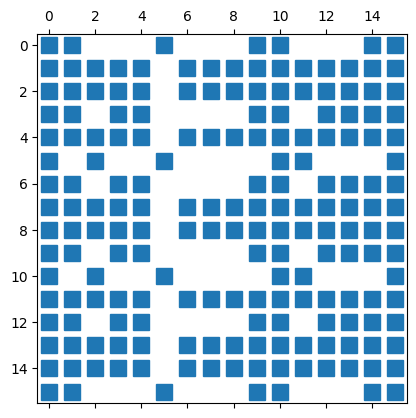

In [8]:
plt.spy(evecs, precision=1e-12, markersize=12)
plt.show()

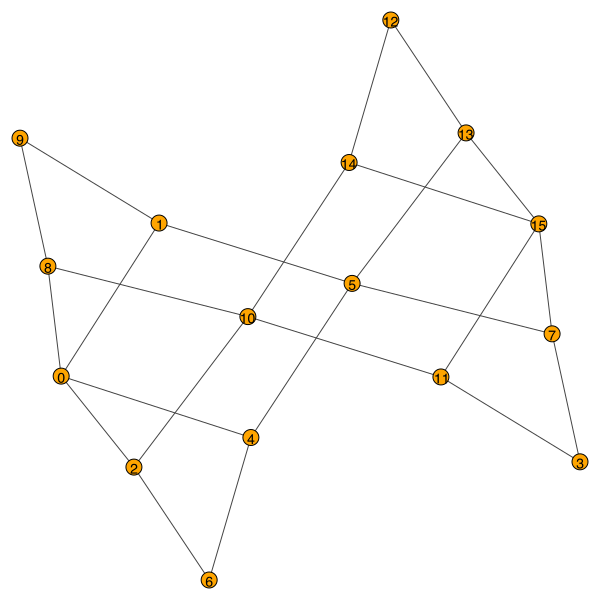

In [9]:
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
# color = ["orange" for i in range(ig.vcount())]
# highlight = [
#     [14, 13, 11, 7],
#     [1, 8, 2, 4],
# ]
# highlight_color = ["aqua", "yellowgreen"]
# for i, nodes in enumerate(highlight):
#     for node in nodes:
#         color[node] = highlight_color[i]
# ig.vs["color"] = color
# sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 4)[0])
# fig, ax = plt.subplots(figsize=(6, 6), facecolor="white")
igraph.plot(
    ig,
    layout=ig.layout_kamada_kawai(),
    vertex_size=16,
    vertex_color="orange",
    # target=ax
)

In [ ]:
net = nt.Network(filter_menu=True, select_menu=True)
net.from_nx(g)
net.show_buttons(filter_=['nodes', 'edges', 'physics'])
net.write_html("nx.html")

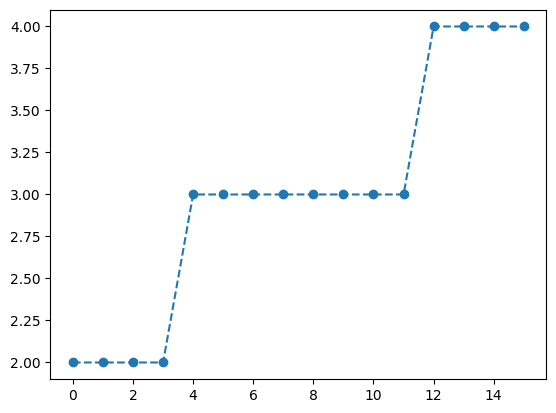

In [11]:
two_steps_mat = np.linalg.matrix_power(model.kinetic_term.toarray(), 2)
sort_idx = np.argsort(np.diag(two_steps_mat))

plt.plot(np.diag(two_steps_mat[sort_idx, :][:, sort_idx]), linestyle="--", marker="o")
plt.show()

In [ ]:
g = nx.from_numpy_array(two_steps_mat)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 3)[0])
igraph.plot(
    sub_ig,
    # layout=ig.layout_kamada_kawai(),
    # vertex_size=8,
    vertex_color="orange",
    # edge_width=0.4,
    # edge_color="darkgray",
    # vertex_label_size=6,
    inline=True
)

In [ ]:
two_steps_mat = two_steps_mat[sort_idx, :][:, sort_idx]

mask = np.where(np.diag(two_steps_mat) == 3)[0]
two_steps_mat = two_steps_mat[mask[0]:mask[-1] + 1, mask[0]:mask[-1] + 1]
# two_steps_mat[two_steps_mat < 2] = 0

print(model.kinetic_term.shape[0] - np.linalg.matrix_rank(model.kinetic_term))
print(two_steps_mat.shape[0] - np.linalg.matrix_rank(two_steps_mat))

plt.matshow(two_steps_mat)
plt.colorbar()

In [ ]:
evals2, evecs2 = np.linalg.eigh(two_steps_mat)
print(evals2)

plt.matshow(evecs2)
plt.colorbar()
null_space(two_steps_mat)

In [ ]:
entropies = np.asarray([model.entropy(evecs[:, i], 1, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df

In [ ]:
entropy_df.plot(style='o')

In [ ]:
i = 5
plt.plot(evecs[:, i], linestyle='--', marker='o')
np.where(np.abs(evecs[:, i]) > 0.2)[0]

In [ ]:
fig, axes = plt.subplots(4, 4, figsize=(16, 16), facecolor="white")
ax = axes.flatten()

for i in range(basis.n_states):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[i]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[i]}")

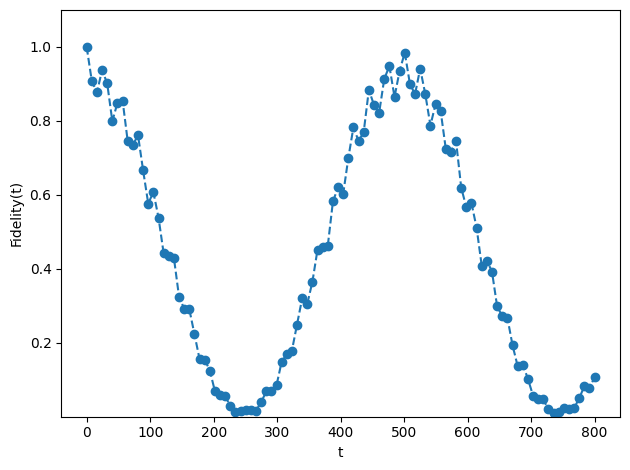

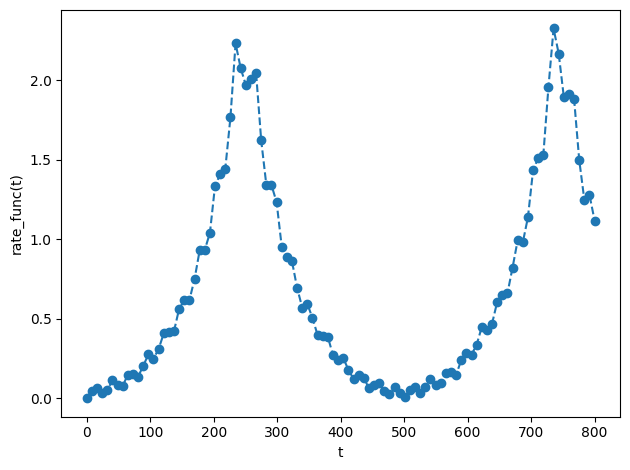

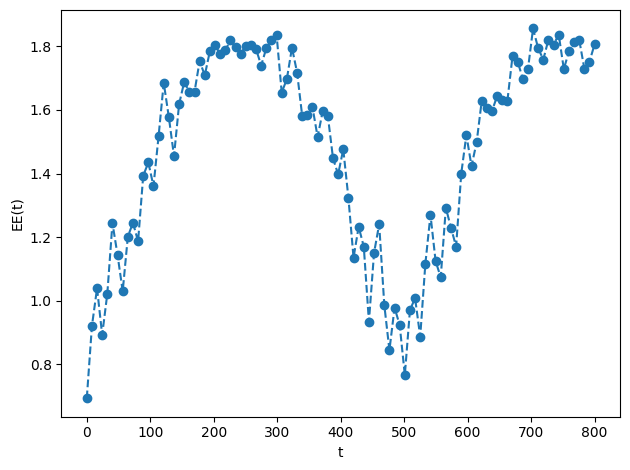

final fidelity = 0.10704142265616585
O_kin @ psi_scar = [ 0.0748168 -0.09961686j -0.01478532+0.00801939j  0.01135165-0.00139098j
 -0.04429103+0.01899899j -0.01013324-0.00487887j -0.00913875-0.05358877j
  0.04005686-0.03046679j -0.01442832-0.00545908j  0.00669957+0.01150727j
  0.03475995-0.06915007j -0.0046265 -0.00803011j  0.00705657-0.0019712j
 -0.04429103+0.01899899j -0.01442832-0.00545908j  0.00705657-0.0019712j
 -0.08858205+0.03799799j]
<O_kin> = (0.0018003748717473327+0.0023222428999440715j)
<O_pot> = (-2.163253874862322-0.09395432846817378j)
<H> = (1.5124773375318779+0.06344578702777759j)


In [10]:
coup_j = np.ones((np.prod(model.shape), 1))
coup_j[0] = 1.1
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
scar_state[np.array([1, 8, 2, 4]), 0] = np.array([1, -1, 1, -1])
scar_state /= np.linalg.norm(scar_state)

start, stop, num = 0, 800, 100
evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
rate_func = [-np.log(evol_state.T @ scar_state).item() for evol_state in evol_states]
entropy = [model.entropy(evol_state.flatten(), 1, 0) for evol_state in evol_states]

plt.plot(np.linspace(start, stop, num), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), rate_func, linestyle="--", marker="o")
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("rate_func(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), np.round(entropy, 12), linestyle="--", marker="o")
plt.xlabel("t")
plt.ylabel("EE(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[-1], tol=1e-12)
print(f"final fidelity = {fidelity[-1]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

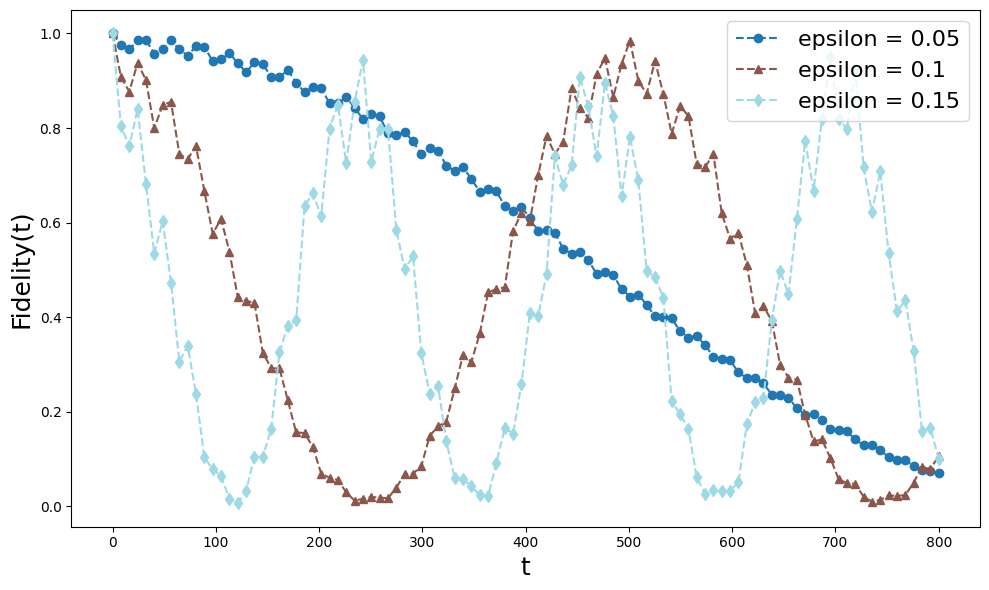

In [38]:
fig, ax = plt.subplots(figsize=(10, 6), facecolor="white")
ax.set_prop_cycle(color=plt.cm.tab20(np.linspace(0, 1, 3)), marker=['o', '^', 'd'])

for i, epsilon in enumerate([0.05, 0.1, 0.15]):
    coup_j = np.ones((np.prod(model.shape), 1))
    coup_j[0] += epsilon
    energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
    energy_lump_ham = energy_lump_model.hamiltonian

    scar_state = np.zeros((basis.n_states, 1))
    scar_state[np.array([1, 8, 2, 4]), 0] = np.array([1, -1, 1, -1])
    scar_state /= np.linalg.norm(scar_state)
    
    start, stop, num = 0, 800, 100
    evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
    fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
    # rate_func = [-np.log(evol_state.T @ scar_state).item() for evol_state in evol_states]
    # entropy = [model.entropy(evol_state.flatten(), 1, 0) for evol_state in evol_states]
    
    ax.plot(np.linspace(start, stop, num), fidelity, linestyle="--")
    
ax.legend([f"epsilon = {epsilon}" for epsilon in [0.05, 0.1, 0.15]], fontsize=16)
plt.xlabel("t", fontsize=18)
plt.ylabel("Fidelity(t)", fontsize=18)
plt.tight_layout()

# QDM Lattice 4x4

In [39]:
coup_j, coup_rk = (1, -0.7)
basis, model = setup_dimer_model(lattice_shape=(4, 4), n_solution=132, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian.toarray())

2024-03-15 01:48:02 [deep_first_search.py] INFO: Deep First Search starts.
2024-03-15 01:48:02 [deep_first_search.py] INFO: No more new Solutions can be found, end up with 132 Solutions in 1627 steps.


In [8]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
(0) 1142025915,0,1,0,0,0,1,0,0,0,0,...,1,0,1,0,1,1,1,0,1,1
(1) 1143328443,0,1,0,0,0,1,0,0,0,0,...,1,0,1,0,1,1,1,0,1,1
(2) 1146285243,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
(3) 1147587771,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
(4) 1147913403,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
(5) 1147914675,0,1,0,0,0,1,0,0,0,1,...,0,1,1,0,1,1,0,0,1,1
(6) 1152797883,0,1,0,0,0,1,0,0,1,0,...,0,0,1,0,1,1,1,0,1,1
(7) 1152818235,0,1,0,0,0,1,0,0,1,0,...,0,0,0,0,1,1,1,0,1,1
(8) 1153123515,0,1,0,0,0,1,0,0,1,0,...,0,0,1,0,1,1,1,0,1,1
(9) 1153124787,0,1,0,0,0,1,0,0,1,0,...,0,1,1,0,1,1,0,0,1,1


In [6]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df[evecs_df["kin"].abs() < 1e-12]

,eval,kin,pot
43,-4.2,3.096279e-29,6.0
72,-2.8,-2.536804e-27,4.0
73,-2.8,-1.626673e-26,4.0
74,-2.8,-2.536385e-27,4.0
75,-2.8,-1.465901e-27,4.0
76,-2.8,-4.394387e-28,4.0
77,-2.8,-4.157987e-27,4.0
78,-2.8,-2.219972e-27,4.0
79,-2.8,-3.055271e-27,4.0
80,-2.8,-8.107518e-28,4.0


In [ ]:
evecs_df.plot(style='.', grid=True)

In [ ]:
k_rank = np.linalg.matrix_rank(model.kinetic_term.toarray())
h_rank = np.linalg.matrix_rank(model.hamiltonian.toarray())
print(k_rank, h_rank, basis.n_states, (basis.n_states - k_rank) / basis.n_states)

In [ ]:
plt.spy(evecs, precision=1e-12, markersize=0.1)
plt.show()

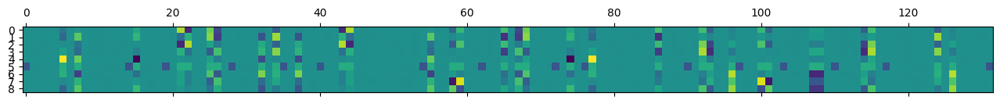

In [10]:
plt.matshow(evecs[:, 72:81].T)

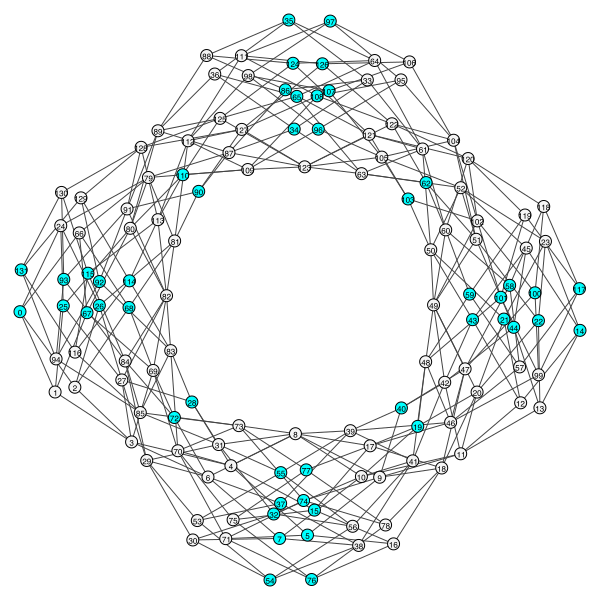

In [11]:
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    # [34, 65, 86, 124],
    # [96, 108, 107, 126],
    # [93, 115, 92, 114],
    # [77, 74, 15, 5],
    # [59, 101, 58, 100],
    # [25, 67, 26, 68],
    # [55, 37, 32, 7],
    # [43, 21, 44, 22]
    np.where(np.abs(evecs[:, 77]) > 0.01)[0],  # type-I, <pot> = 4
    # np.where(np.abs(evecs[:, 43]) > 0.15)[0],  # type-I, <pot> = 6
    # np.where(np.diag(two_steps_mat) == 4)[0],
    # np.where(np.diag(two_steps_mat) == 6)[0],
]
highlight_color = [
    "aqua",
    # "deepskyblue",
    # "yellowgreen",
    # "royalblue",
    # "blueviolet",
    # "cornflowerblue",
    # "limegreen",
    # "pink"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
# fig, ax = plt.subplots(figsize=(10, 10), facecolor="white")
# sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 4)[0])
# sub_ig = ig.induced_subgraph(np.where(np.abs(evecs[:, 43]) > 0.1)[0])
igraph.plot(
    ig,
    layout=ig.layout_kamada_kawai(),
    vertex_size=12,
    # vertex_color="orange",
    vertex_label_size=8,
    # target=ax
)

In [ ]:
net = nt.Network(filter_menu=True, select_menu=True, font_color="black")
net.from_nx(g)
for node in net.nodes:
    node["title"] = str(node["id"])
net.show_buttons(filter_=['nodes', 'edges', 'physics'])
net.write_html("nx.html")

In [ ]:
two_steps_mat = np.linalg.matrix_power(model.kinetic_term.toarray(), 2)
sort_idx = np.argsort(np.diag(two_steps_mat))

plt.plot(np.diag(two_steps_mat[sort_idx, :][:, sort_idx]), linestyle="--", marker="o")
plt.show()

In [ ]:
g = nx.from_numpy_array(two_steps_mat)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 4)[0])
igraph.plot(
    sub_ig,
    # layout=sub_ig.layout_kamada_kawai(),
    # vertex_size=8,
    vertex_color="orange",
    # edge_width=0.4,
    # edge_color="darkgray",
    # vertex_label_size=6,
    inline=True
)

In [ ]:
sub_components = sub_ig.connected_components(mode="weak")

for c in sub_components:
    mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
    print(mat.shape[0] - np.linalg.matrix_rank(mat))

In [ ]:
two_steps_mat = two_steps_mat[sort_idx, :][:, sort_idx]

mask = np.where(np.diag(two_steps_mat) == 4)[0]
two_steps_mat = two_steps_mat[mask[0]:mask[-1] + 1, mask[0]:mask[-1] + 1]
# two_steps_mat = two_steps_mat - np.diagflat(np.diag(two_steps_mat))
two_steps_mat[two_steps_mat < 2] = 0

print(model.kinetic_term.shape[0] - np.linalg.matrix_rank(model.kinetic_term.toarray()))
print(two_steps_mat.shape[0] - np.linalg.matrix_rank(two_steps_mat))

plt.matshow(two_steps_mat)
plt.colorbar()

In [ ]:
two_steps_mat = nx.to_numpy_array(sub_ig.subgraph(sub_components[0]).to_networkx())
# two_steps_mat = two_steps_mat - np.diagflat(np.diag(two_steps_mat))
two_steps_mat[two_steps_mat < 2] = 0
    
g = nx.from_numpy_array(two_steps_mat)
ig = igraph.Graph.from_networkx(g)
igraph.plot(
    ig,
    # layout=sub_ig.layout_kamada_kawai(),
    # vertex_size=8,
    vertex_color="orange",
    # edge_width=0.4,
    # edge_color="darkgray",
    # vertex_label_size=6,
    inline=True
)

In [ ]:
sub_components = ig.connected_components(mode="weak")

for c in sub_components:
    mat = nx.to_numpy_array(ig.subgraph(c).to_networkx())
    print(mat.shape[0] - np.linalg.matrix_rank(mat))

In [ ]:
entropies = np.asarray([model.entropy(evecs[:, i], 2, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df[entropy_df < 1.9]

In [ ]:
entropy_df.plot(style='o', grid=True)

In [ ]:
i = 43
plt.plot(evecs[:, i], linestyle='--', marker='o')
np.where(np.abs(evecs[:, i]) > 0.1)[0]

In [ ]:
# {i: len(np.where(np.abs(evecs[:, i]) > 1e-12)[0]) for i in range(300)}

fig, axes = plt.subplots(4, 4, figsize=(32, 24), facecolor="white")
ax = axes.flatten()

for i, val in enumerate(np.where(np.abs(evecs[:, 43]) > 0.1)[0][:16]):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[val]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[val]}")

/Users/tandaolin/projects/qlinks/.venv/lib/python3.11/site-packages/scipy/sparse/linalg/_eigen/arpack/arpack.py:1577: RuntimeWarning: k >= N - 1 for N * N square matrix. Attempting to use scipy.linalg.eig instead.
  ret = eigs(A, k, M=M, sigma=sigma, which=which, v0=v0,


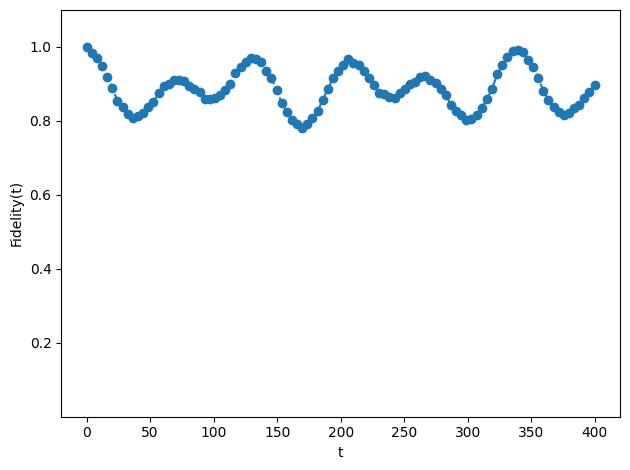

/Users/tandaolin/projects/qlinks/.venv/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


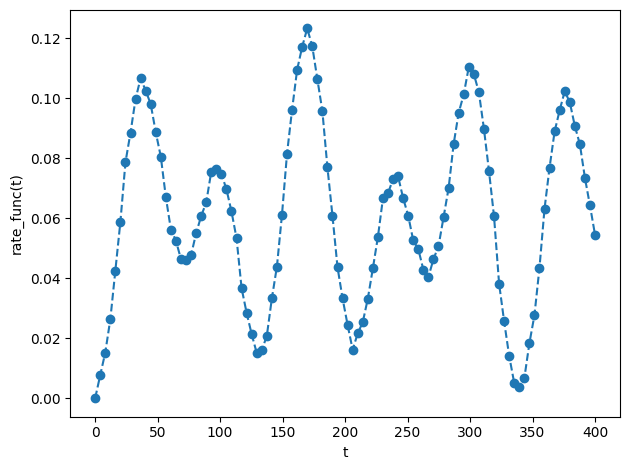

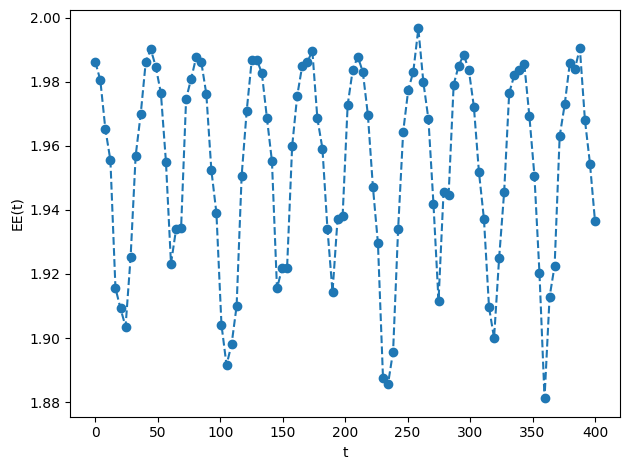

final fidelity = 0.8966671909442546
O_kin @ psi_scar = [ 9.18480944e-04-9.97883627e-04j -1.17669536e-02-2.52612178e-03j
  3.91567139e-03+2.74944612e-03j  2.89543201e-02-7.53391411e-02j
 -1.93993706e-02+5.74762797e-02j -1.43291398e-03+5.31345357e-04j
 -2.07640456e-02+5.70215200e-02j -2.39282067e-03+3.77488398e-03j
  4.33680869e-16+1.43635104e-15j -3.34043535e-03-1.85144475e-03j
  3.34043535e-03+1.85144475e-03j  5.11851846e-15+9.96945582e-15j
 -1.16573418e-15+6.10622664e-16j  8.46545056e-16-8.11850587e-16j
  5.82650247e-16+1.08246745e-15j -4.94233242e-04+3.11886813e-03j
 -2.84179905e-03+4.94721525e-03j -4.05778114e-04+2.04685070e-03j
 -8.17504026e-03+2.49256703e-02j -5.82941178e-04-1.91674582e-03j
  2.39561048e-03-1.56680737e-02j -7.36760463e-04-2.97251808e-04j
 -7.36760463e-04-2.97251808e-04j  3.44155450e-06+3.71311246e-04j
  3.40125036e-03+2.17657390e-03j -4.97466263e-03-2.25995787e-03j
 -2.09571443e-03+5.67601410e-03j -8.64037826e-03+1.79686199e-02j
 -3.41740525e-16+3.22658567e-16j  9

In [18]:
coup_j = np.ones((np.prod(model.shape), 1))
coup_j[3] = 1.2
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

# scar_state = np.zeros((basis.n_states, 1))
# scar_state[np.array([25, 26, 67, 68]), 0] = np.array([1, -1, -1, 1])
# scar_state /= np.linalg.norm(scar_state)
scar_state = evecs[:, 78]

start, stop, num = 0, 400, 100
evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
rate_func = [-np.log(evol_state.T @ scar_state).item() for evol_state in evol_states]
entropy = [model.entropy(evol_state.flatten(), 2, 0) for evol_state in evol_states]

plt.plot(np.linspace(start, stop, num), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), rate_func, linestyle="--", marker="o")
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("rate_func(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), np.round(entropy, 12), linestyle="--", marker="o")
plt.xlabel("t")
plt.ylabel("EE(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[-1], tol=1e-12)
print(f"final fidelity = {fidelity[-1]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

/Users/tandaolin/projects/qlinks/.venv/lib/python3.11/site-packages/matplotlib/cbook/__init__.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


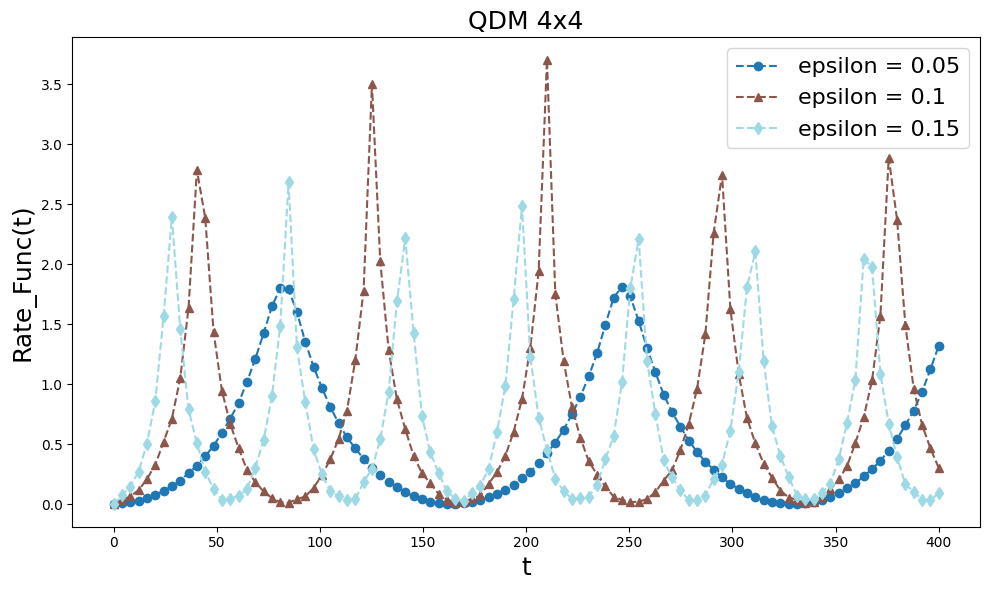

In [61]:
fig, ax = plt.subplots(figsize=(10, 6), facecolor="white")
ax.set_prop_cycle(color=plt.cm.tab20(np.linspace(0, 1, 3)), marker=['o', '^', 'd'])

for i, epsilon in enumerate([0.05, 0.1, 0.15]):
    coup_j = np.ones((np.prod(model.shape), 1))
    coup_j[5] += epsilon
    energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
    energy_lump_ham = energy_lump_model.hamiltonian

    scar_state = np.zeros((basis.n_states, 1))
    scar_state[np.array([25, 26, 67, 68]), 0] = np.array([1, -1, -1, 1])
    scar_state /= np.linalg.norm(scar_state)
    # scar_state = evecs[:, 77]
    
    start, stop, num = 0, 400, 100
    evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
    # fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
    rate_func = [-np.log(evol_state.T @ scar_state).item() for evol_state in evol_states]
    # entropy = [model.entropy(evol_state.flatten(), 1, 0) for evol_state in evol_states]
    
    # ax.plot(np.linspace(start, stop, num), fidelity, linestyle="--")
    # ax.plot(np.linspace(start, stop, num), np.round(entropy, 12), linestyle="--")
    ax.plot(np.linspace(start, stop, num), rate_func, linestyle="--")
    
ax.legend([f"epsilon = {epsilon}" for epsilon in [0.05, 0.1, 0.15]], fontsize=16, loc="upper right")
# plt.ylim(0.0001, 1.1)
plt.title("QDM 4x4", fontsize=18)
plt.xlabel("t", fontsize=18)
plt.ylabel("Rate_Func(t)", fontsize=18)
plt.tight_layout()

# QDM Lattice 6x2

In [ ]:
coup_j, coup_rk = (1, 1)
basis, model = setup_dimer_model(lattice_shape=(6, 2), n_solution=76, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian.toarray())

In [ ]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

In [ ]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df[evecs_df["kin"].abs() < 1e-12]

3 type I
4 as type III A or Type II? 
or maybe these 2 types can be treated as the same 

In [ ]:
evecs_df.plot(style='.', grid=True)

In [ ]:
plt.matshow(evecs[:, 34:42].T)
plt.colorbar()

In [ ]:
k_rank = np.linalg.matrix_rank(model.kinetic_term.toarray())
h_rank = np.linalg.matrix_rank(model.hamiltonian.toarray())
print(k_rank, h_rank, basis.n_states, (basis.n_states - k_rank) / basis.n_states)

In [ ]:
plt.spy(evecs, precision=1e-12, markersize=1)
plt.show()

In [ ]:
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    np.where(np.diag(two_steps_mat) == 2)[0],
    np.where(np.diag(two_steps_mat) == 3)[0],
    np.where(np.diag(two_steps_mat) == 4)[0],
    np.where(np.diag(two_steps_mat) == 5)[0],
    # np.where(evecs[:, 40] > 0.1)[0],
    # np.where(evecs[:, 40] < -0.1)[0],
]
highlight_color = [
    # "aqua",
    # "deepskyblue",
    "yellowgreen",
    "tomato",
    "royalblue",
    # "blueviolet",
    # "cornflowerblue",
    # "limegreen",
    "pink"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
# fig, ax = plt.subplots(figsize=(10, 8), facecolor="white")
# sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 4)[0])
igraph.plot(
    ig,
    layout=ig.layout_kamada_kawai(),
    vertex_size=14,
    # vertex_color="orange",
    vertex_label_size=10,
    # target=ax
)

In [ ]:
sub_components = sub_ig.connected_components(mode="weak")

for c in sub_components:
    mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
    print(mat.shape[0] - np.linalg.matrix_rank(mat))

In [ ]:
np.linalg.eigh(nx.to_numpy_array(sub_ig.subgraph(sub_components[0]).to_networkx()))[1][:, 5:7]

In [ ]:
net = nt.Network(filter_menu=True, select_menu=True, font_color="black")
net.from_nx(g)
for node in net.nodes:
    node["title"] = str(node["id"])
net.show_buttons(filter_=['nodes', 'edges', 'physics'])
net.write_html("nx.html")

In [ ]:
two_steps_mat = np.linalg.matrix_power(model.kinetic_term.toarray(), 2)
sort_idx = np.argsort(np.diag(two_steps_mat))

plt.plot(np.diag(two_steps_mat[sort_idx, :][:, sort_idx]), linestyle="--", marker="o")
plt.show()

In [ ]:
g = nx.from_numpy_array(two_steps_mat)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    # np.where(np.diag(two_steps_mat) == 3)[0],
    # np.where(np.diag(two_steps_mat) == 4)[0],
    # np.where(np.diag(two_steps_mat) == 5)[0],
    # np.where(np.abs(evecs[:, 39]) > 0.15)[0],
]
highlight_color = [
    # "aqua",
    # "deepskyblue",
    # "tomato",
    # "yellowgreen",
    # "royalblue",
    # "blueviolet",
    # "cornflowerblue",
    # "limegreen",
    # "pink"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
sub_ig = ig.induced_subgraph(np.where((np.diag(two_steps_mat) == 5) | (np.diag(two_steps_mat) == 4))[0])
igraph.plot(
    sub_ig,
    # layout=ig.layout_kamada_kawai(),
    # vertex_size=8,
    # vertex_color="orange",
    # edge_width=0.4,
    # edge_color="darkgray",
    # vertex_label_size=6,
    inline=True
)

In [ ]:
sub_components = sub_ig.connected_components(mode="weak")

for c in sub_components:
    mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
    print(mat.shape[0] - np.linalg.matrix_rank(mat))

In [ ]:
nx.to_numpy_array(sub_ig.subgraph(sub_components[1]).to_networkx())

In [ ]:
np.linalg.eigh(nx.to_numpy_array(sub_ig.subgraph(sub_components[0]).to_networkx()))

In [ ]:
# g = nx.from_numpy_array(two_steps_mat)
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    # list(map(int, sub_ig.subgraph(sub_components[0]).vs["label"])),
    # list(map(int, sub_ig.subgraph(sub_components[1]).vs["label"])),
    # list(map(int, sub_ig.subgraph(sub_components[2]).vs["label"])),
    np.where(np.abs(evecs[:, 36]) > 0.08)[0],
    # np.where(np.diag(two_steps_mat) == 4)[0]
    # [7, 12, 34, 41, 57, 68]
]
highlight_color = [
    # "tomato",
    "yellowgreen",
    # "royalblue",
    # "aqua",
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
# sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 4)[0])
# sub_ig = ig.induced_subgraph(np.where(np.abs(evecs[:, 40]) > 0.05)[0])
igraph.plot(
    ig,
    layout=ig.layout_kamada_kawai(),
    vertex_size=14,
    # vertex_color="orange",
    edge_width=0.2,
    # edge_color="gray"
    vertex_label_size=8,
)

In [ ]:
two_steps_mat = two_steps_mat[sort_idx, :][:, sort_idx]

mask = np.where((np.diag(two_steps_mat) == 4))[0]
two_steps_mat = two_steps_mat[mask[0]:mask[-1] + 1, mask[0]:mask[-1] + 1]
# two_steps_mat = two_steps_mat - np.diagflat(np.diag(two_steps_mat))
# two_steps_mat[two_steps_mat < 2] = 0

print(model.kinetic_term.shape[0] - np.linalg.matrix_rank(model.kinetic_term.toarray()))
print(two_steps_mat.shape[0] - np.linalg.matrix_rank(two_steps_mat))

plt.matshow(two_steps_mat)
plt.colorbar()

In [ ]:
fig, axes = plt.subplots(19, 4, figsize=(30, 60), facecolor="white")
ax = axes.flatten()

for i in range(basis.n_states):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[i]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[i]}")

In [ ]:
entropies = np.asarray([model.entropy(evecs[:, i], 0, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df.loc[(entropy_df.index >= 20) & (entropy_df.index <= 50) & (entropy_df < 1.75)]

In [ ]:
entropy_df.plot(style='o')

In [ ]:
i = 37
plt.plot(evecs[:, i], linestyle='--', marker='o')
plt.axvline(25, linestyle='--', color='gray')
plt.axvline(50, linestyle='--', color='gray')
plt.grid()
np.where(np.abs(evecs[:, i]) > 0.2)[0]

In [ ]:
g = nx.from_numpy_array(-model.kinetic_term)
degree_sequence = sorted((d for n, d in g.degree(np.where(np.abs(evecs[:, 38]) > 0.01)[0])), reverse=True)
plt.plot(degree_sequence, linestyle='--', marker='o')
plt.grid()
np.mean(degree_sequence)

In [ ]:
cyc_g = nx.cycle_graph(6)
mat = 4 * np.eye(6) + 2 * nx.to_numpy_array(cyc_g)
evals2, evecs2 = np.linalg.eigh(mat)
evals2

In [ ]:
evecs2[:, 0]

In [ ]:
coup_j = np.ones((np.prod(model.shape), 1))
# coup_j[0] = 1.05
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
# scar_state[np.array([30, 45, 49, 26, 29, 44, 15, 52, 60, 17, 23, 62]), 0] = np.array([-1, -1, -1, 1, 1, 1, 1, 1, 1, -1, -1, -1])  # based on 44
# scar_state[np.array([3, 11, 16, 32, 36, 47, 58, 69]), 0] = np.array([1, -1, -1, 1, 1, -1, 1, -1])  # based on 24
scar_state[np.array([6, 9, 22, 28, 39, 43]), 0] = evecs2[:, 0].flatten()
scar_state /= np.linalg.norm(scar_state)
# scar_state = evecs[:, 44]

start, stop, num = 0, 2000, 100
evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
entropy = [model.entropy(evol_state.flatten(), 1, 0) for evol_state in evol_states]

plt.plot(np.linspace(start, stop, num), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), entropy, linestyle="--", marker="o")
plt.xlabel("t")
plt.ylabel("EE(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[0], tol=1e-12)
print(f"final fidelity = {fidelity[0]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")


# QDM Lattice 6x4

In [ ]:
coup_j, coup_rk = (1, -0.7)
basis, model = setup_dimer_model(lattice_shape=(6, 4), n_solution=1456, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian.toarray())

In [ ]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

In [ ]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df[evecs_df["kin"].abs() < 1e-12]

In [ ]:
evecs_df.plot(style='.', grid=True, markersize=1)

In [ ]:
k_rank = np.linalg.matrix_rank(model.kinetic_term.toarray())
h_rank = np.linalg.matrix_rank(model.hamiltonian.toarray())
print(k_rank, h_rank, basis.n_states, (basis.n_states - k_rank) / basis.n_states)

In [ ]:
plt.spy(evecs, precision=1e-12, markersize=0.01)
plt.show()

In [ ]:
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["orange" for i in range(ig.vcount())]
highlight = [
    # [1099, 1102, 1239, 1256],
    # [604, 601, 331, 311],
    # [830, 891, 205, 117],
    # [355, 868, 808, 352],
    # [390, 367, 655, 695], 
    # [1047, 1212, 1226, 1082],
]
highlight_color = [
    # "aqua",
    # "deepskyblue",
    # "yellowgreen",
    # "royalblue",
    # "blueviolet",
    # "cornflowerblue"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
# sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 4)[0])
fig, ax = plt.subplots(figsize=(10, 10), facecolor="white")
igraph.plot(
    ig,
    layout=ig.layout_kamada_kawai(),
    vertex_size=32,
    # vertex_color="orange",
    edge_width=0.4,
    # edge_color="darkgray",
    vertex_label_size=6,
    target=ax
)
fig.tight_layout()
fig.savefig("qdm_6x4_kinetic_graph.png", dpi=300)

In [ ]:
sub_components = sub_ig.connected_components(mode="weak")

for c in sub_components:
    mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
    print(mat.shape[0] - np.linalg.matrix_rank(mat))

In [ ]:
np.linalg.eigh(nx.to_numpy_array(sub_ig.subgraph(sub_components[0]).to_networkx()))[1][:, 3:6]

In [ ]:
net = nt.Network(filter_menu=True, select_menu=True, font_color="black")
net.from_nx(g)
for node in net.nodes:
    node["title"] = str(node["id"])
net.show_buttons(filter_=['nodes', 'edges', 'physics'])
net.write_html("nx.html")

In [ ]:
two_steps_mat = np.linalg.matrix_power(model.kinetic_term, 2)
sort_idx = np.argsort(np.diag(two_steps_mat))

plt.plot(np.diag(two_steps_mat[sort_idx, :][:, sort_idx]), linestyle="--", marker="o")
plt.show()

In [ ]:
g = nx.from_numpy_array(two_steps_mat)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 4)[0])
igraph.plot(
    sub_ig,
    # layout=sub_ig.layout_kamada_kawai(),
    # vertex_size=8,
    vertex_color="orange",
    # edge_width=0.4,
    # edge_color="darkgray",
    # vertex_label_size=6,
    inline=True
)

In [ ]:
sub_components = sub_ig.connected_components(mode="weak")

for c in sub_components:
    mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
    print(mat.shape[0] - np.linalg.matrix_rank(mat))

In [ ]:
entropies = np.asarray([model.entropy(evecs[:, i], 1, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df[entropy_df < 2.0]

In [ ]:
entropy_df.plot(style='o')

In [ ]:
i = 231
plt.plot(evecs[:, i], linestyle='--', marker='o')
np.where(np.abs(evecs[:, i]) > 0.075)[0]

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12), facecolor="white")
ax = axes.flatten()

for i, val in enumerate(np.where(np.abs(evecs[:, 231]) > 0.075)[0][:4]):  
    #([891, 829, 1213, 354]):  #[1099, 1102, 1239, 1256]
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[val]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[val]}")

In [ ]:
g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[1213]))
g.plot(node_size=800)

In [ ]:
coup_j = np.ones((np.prod(model.shape), 1))
# coup_j[0] = 1.1
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
# scar_state[np.array([1099, 1102, 1239, 1256]), 0] = np.array([1, -1, -1, 1])
scar_state[np.array([117, 118, 205, 828, 829, 830, 831, 885, 891]), 0] = np.array([0.55255026,  0.21474467, -0.20558535, -0.21474467, -0.34696492,
        -0.20558535,  0.21474467, -0.21474467,  0.55255026])
scar_state /= np.linalg.norm(scar_state)

start, stop, num = 0, 200, 100
evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
entropy = [model.entropy(evol_state.flatten(), 1, 0) for evol_state in evol_states]

plt.plot(np.linspace(start, stop, num), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), entropy, linestyle="--", marker="o")
plt.xlabel("t")
plt.ylabel("EE(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[0], tol=1e-12)
print(f"final fidelity = {fidelity[0]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

# QDM Lattice 8x4

In [ ]:
# coup_j, coup_rk = (1, 1)  # dfs 2 mins 50 secs
# basis, model = setup_dimer_model(lattice_shape=(8, 4), n_solution=17412, coup_j=coup_j, coup_rk=coup_rk) 

In [3]:
# basis.dataframe.to_parquet("qdm_8x4_lattice.parquet", index=False)
basis = ComputationBasis.from_parquet("data/qdm_8x4_lattice.parquet")
coup_j, coup_rk = (1, 0)
model = QuantumLinkModel(coup_j, coup_rk, (8, 4), basis)

In [4]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,...,54,55,56,57,58,59,60,61,62,63
(0) 4919075461716163515,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(1) 4919075547613412283,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(2) 4919076836072143803,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(3) 4919076921969392571,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(4) 4919077265558387643,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(5) 4919077265563630395,0,1,0,0,0,1,0,0,0,1,...,1,1,0,0,1,1,1,0,1,1
(6) 4919097451411848123,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(7) 4919097537309096891,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(8) 4919098825767828411,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(9) 4919098911665077179,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1


In [6]:
evals, evecs = np.load("data/qdm_8x4_coup_j_1_coup_rk_0_eigs.npz").values()

In [7]:
evecs_df = pd.read_parquet("data/qdm_8x4_coup_j_1_coup_rk_0_eigs.parquet")
evecs_df[(evecs_df["kin"].abs() - np.sqrt(2)).abs() < 1e-12]

,eval,kin,pot
5587,-1.414214,1.414214,6.5
5588,-1.414214,1.414214,6.5
5589,-1.414214,1.414214,6.5
5590,-1.414214,1.414214,6.5
5591,-1.414214,1.414214,6.5
5592,-1.414214,1.414214,6.5
5593,-1.414214,1.414214,6.5
5594,-1.414214,1.414214,6.5
5595,-1.414214,1.414214,6.5
5596,-1.414214,1.414214,6.5


In [ ]:
evecs_df[evecs_df["pot"] < 7]

In [ ]:
evecs_df.plot(style='.', grid=True, markersize=1)

In [ ]:
plt.spy(evecs, precision=1e-12, markersize=0.05)
plt.show()

array([1337, 1410, 2364, 2503, 7454, 7548, 8419, 8575])

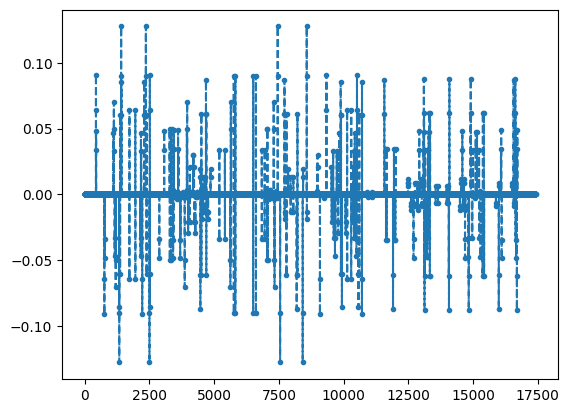

In [8]:
i = 5590
plt.plot(evecs[:, i], linestyle='--', marker='.')
np.where(np.abs(evecs[:, i]) > 0.1)[0]

In [ ]:
g = nx.from_numpy_array(-model.kinetic_term)
degree_sequence = sorted((d for n, d in g.degree(np.where(np.abs(evecs[:, 5602]) > 0.0001)[0])), reverse=True)
plt.plot(degree_sequence, linestyle='--', marker='o')
plt.grid()
np.mean(degree_sequence)

In [ ]:
fig, axes = plt.subplots(4, 2, figsize=(18, 24), facecolor="white")
ax = axes.flatten()

for i, val in enumerate(np.where(np.abs(evecs[:, 5587]) > 0.01)[0][:8]):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[val]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[val]}")

In [ ]:
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
igraph.plot(
    ig,
    layout=ig.layout_kamada_kawai(),
    vertex_size=4,
    vertex_color="orange",
    edge_width=0.1,
    # edge_color="gray"
)

In [16]:
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    np.where(two_steps_mat.diagonal() == 6)[0],
    np.where(two_steps_mat.diagonal() == 7)[0],
]
highlight_color = [
    # "aqua",
    "tomato",
    "deepskyblue",
    # "yellowgreen",
    # "royalblue",
    # "blueviolet",
    # "cornflowerblue"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
sub_ig = ig.induced_subgraph(np.where((two_steps_mat.diagonal() == 6) | (two_steps_mat.diagonal() == 7))[0])
igraph.plot(
    sub_ig,
    # layout=sub_ig.layout_kamada_kawai(),
    vertex_size=4,
    # vertex_color="orange",
    edge_width=0.1,
    # edge_color="gray"
)

In [17]:
nx.write_gexf(sub_ig.to_networkx(), "data.gexf")

In [ ]:
sub_components = sub_ig.connected_components(mode="weak")

nullity = []
for c in sub_components:
    mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
    nullity.append(mat.shape[0] - np.linalg.matrix_rank(mat))
    
np.unique(nullity, return_counts=True)

In [14]:
two_steps_mat = (model.kinetic_term @ model.kinetic_term).astype(int)
# sort_idx = np.argsort(np.diag(two_steps_mat))
# 
# plt.plot(np.diag(two_steps_mat[sort_idx, :][:, sort_idx]), linestyle="--", marker="o")
# plt.show()
print(np.unique(two_steps_mat.diagonal()))

[ 4  5  6  7  8  9 10 11 12 13 14 16]


In [ ]:
# two_steps_mat[two_steps_mat < 2] = 0
g = nx.from_numpy_array(two_steps_mat)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    # np.where(np.abs(evecs[:, 5590]) > 0.1)[0],
    # np.where((np.diag(two_steps_mat) == 6))[0],
    # np.where((np.diag(two_steps_mat) == 7))[0],
]
highlight_color = [
    # "aqua",
    # "deepskyblue",
    # "yellowgreen",
    # "tomato",
    # "royalblue",
    # "cornflowerblue"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 8)[0])
# sub_ig = ig.induced_subgraph(np.where((np.diag(two_steps_mat) == 6) | (np.diag(two_steps_mat) == 7))[0])
igraph.plot(
    sub_ig,
    # layout=sub_ig.layout_kamada_kawai(),
    vertex_size=6,
    # vertex_color="orange",
    edge_width=0.2,
    # edge_color="darkgray",
    vertex_label_size=2,
    inline=True
)

In [ ]:
sub_components = sub_ig.connected_components(mode="weak")

for c in sub_components:
    mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
    print(mat.shape[0] - np.linalg.matrix_rank(mat))

In [ ]:
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    np.where(np.diag(two_steps_mat) == 6)[0],
    np.where(np.diag(two_steps_mat) == 7)[0],
    # np.where(np.abs(evecs[:, 5587]) > 0.05)[0]
]
highlight_color = [
    # "aqua",
    # "deepskyblue",
    # "yellowgreen",
    "tomato",
    "royalblue",
    # "cornflowerblue"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
sub_ig = ig.induced_subgraph(np.where((np.diag(two_steps_mat) == 6) | (np.diag(two_steps_mat) == 7))[0])
igraph.plot(
    sub_ig,
    # layout=ig.layout_kamada_kawai(),
    vertex_size=6,
    # vertex_color="orange",
    edge_width=0.1,
    # edge_color="gray"
)

In [ ]:
sub_components = sub_ig.components(mode="weak")
np.unique([len(c) for c in sub_components], return_counts=True)

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10), facecolor="white")
for i, c in enumerate(sub_components): 
    sub_sub_ig = sub_ig.induced_subgraph(c)
    colors, counts = np.unique(sub_sub_ig.vs["color"], return_counts=True)
    if len(counts) == 2:
        if counts[0] == counts[1]:
            print(i)
            igraph.plot(
                sub_sub_ig,
                # layout=sub_sub_ig.layout_kamada_kawai(),
                target=ax,
                vertex_size=6,
                # vertex_color="whitesmoke",
                edge_width=0.1,
                # edge_color="gray",
                inline=True
            )
            break
plt.show()

In [ ]:
sub_gmat = np.asarray(sub_ig.induced_subgraph(sub_components[2]).get_adjacency().data)
np.linalg.eigh(sub_gmat)[0]

/Users/tandaolin/projects/qlinks/.venv/lib/python3.11/site-packages/scipy/sparse/linalg/_eigen/arpack/arpack.py:1577: RuntimeWarning: k >= N - 1 for N * N square matrix. Attempting to use scipy.linalg.eig instead.
  ret = eigs(A, k, M=M, sigma=sigma, which=which, v0=v0,


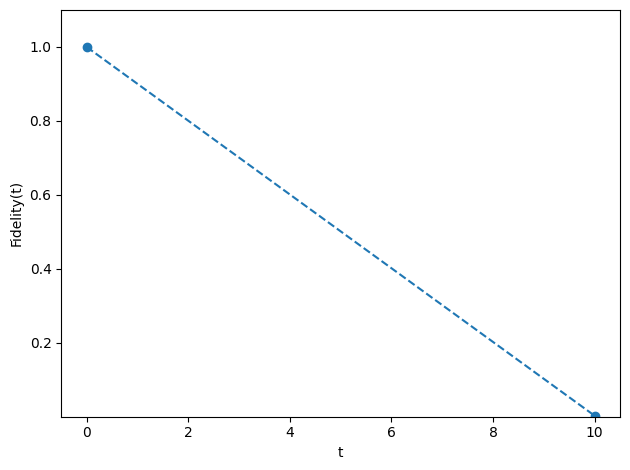

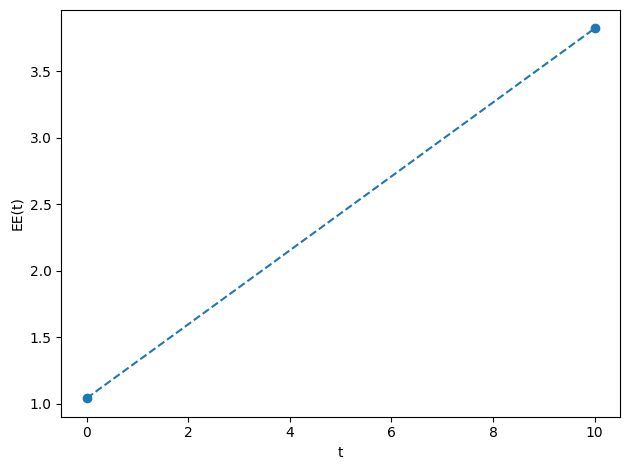

final fidelity = 1.0
O_kin @ psi_scar = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          

In [6]:
coup_j = np.ones((np.prod(model.shape), 1))
# coup_j[0] = 1.0
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
# scar_state[np.array([12841, 14634, 14637]), 0] = np.array([1, np.sqrt(2), 1])
# scar_state[np.array([12984, 14691, 14696]), 0] = np.array([-1, -np.sqrt(2), -1])
# scar_state[np.array([12749, 14596, 14599]), 0] = np.array([-1, -np.sqrt(2), -1])
# scar_state[np.array([12858, 14641, 14645]), 0] = np.array([1, np.sqrt(2), 1])
scar_state[np.array([14634, 14690, 14691]), 0] = np.array([1, np.sqrt(2), 1])
scar_state[np.array([12765, 12879, 12880]), 0] = np.array([-1, -np.sqrt(2), -1])
scar_state[np.array([14605, 14653, 14654]), 0] = np.array([-1, -np.sqrt(2), -1])
scar_state[np.array([14596, 14640, 14641]), 0] = np.array([1, np.sqrt(2), 1])
scar_state /= np.linalg.norm(scar_state)

start, stop, num = 0, 10, 2
evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
entropy = [model.entropy(evol_state.flatten(), 1, 0) for evol_state in evol_states]

plt.plot(np.linspace(start, stop, num), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), np.round(entropy, 12), linestyle="--", marker="o")
plt.xlabel("t")
plt.ylabel("EE(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[0], tol=1e-12)
print(f"final fidelity = {fidelity[0]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

In [12]:
a = (model.kinetic_term @ final_state).flatten() - np.sqrt(2) * scar_state.flatten()
a[np.abs(a) > 1e-10]

array([-0.25      , -0.5       , -0.5       , -0.25      , -0.70710678,
       -0.5       ,  0.25      , -0.25      ,  0.25      ,  0.5       ,
       -0.5       ,  0.5       ,  0.5       ,  0.25      , -0.25      ,
        0.70710678,  0.5       ,  0.25      ])

# Check effective matrix

In [ ]:
l = 0.0
dj = 1.1

mat = np.array(
    [
        [l, dj, dj, 0, 0, 0, 0, 0, 0],
        [dj, l, 0, 1, 1, 0, 0, 0, 0], 
        [dj, 0, l, 0, 1, 1, 0, 0, 0], 
        [0, 1, 0, l, 0, 0, 1, 0, 0], 
        [0, 1, 1, 0, l, 0, 1, 1, 0], 
        [0, 0, 1, 0, 0, l, 0, 1, 0], 
        [0, 0, 0, 1, 1, 0, l, 0, 1],
        [0, 0, 0, 0, 1, 1, 0, l, 1],
        [0, 0, 0, 0, 0, 0, 1, 1, l]
    ]
)

np.linalg.matrix_power(mat, 2) @ np.array([[0, 1, -1, 0, 0, 0, -1, 1, 0]]).T

In [ ]:
for i in range(20):
    print(f"matrix power {i+1}")
    walker = np.linalg.matrix_power(mat, i+1)
    walker /= np.linalg.norm(walker)
    plt.matshow(walker, animated=True)
    plt.colorbar()
    plt.show()
    sleep(0.3)
    clear_output(wait=True)

# QLM Lattice 4x2

In [21]:
coup_j, coup_rk = (1, -0.7)
basis, model = setup_link_model(lattice_shape=(4, 2), n_solution=38, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian.toarray())

2024-04-10 11:27:01 [deep_first_search.py] INFO: Deep First Search starts.
2024-04-10 11:27:01 [deep_first_search.py] INFO: No more new Solutions can be found, end up with 38 Solutions in 232 steps.


In [22]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
(0) 1455,0,0,0,0,0,1,0,1,1,0,1,0,1,1,1,1
(1) 4539,0,0,0,1,0,0,0,1,1,0,1,1,1,0,1,1
(2) 5310,0,0,0,1,0,1,0,0,1,0,1,1,1,1,1,0
(3) 6582,0,0,0,1,1,0,0,1,1,0,1,1,0,1,1,0
(4) 9627,0,0,1,0,0,1,0,1,1,0,0,1,1,0,1,1
(5) 11670,0,0,1,0,1,1,0,1,1,0,0,1,0,1,1,0
(6) 16875,0,1,0,0,0,0,0,1,1,1,1,0,1,0,1,1
(7) 17646,0,1,0,0,0,1,0,0,1,1,1,0,1,1,1,0
(8) 18093,0,1,0,0,0,1,1,0,1,0,1,0,1,1,0,1
(9) 18918,0,1,0,0,1,0,0,1,1,1,1,0,0,1,1,0


In [26]:
print(repr(basis.dataframe.copy(deep=True).to_numpy()))

array([[0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1],
       [0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1],
       [0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0],
       [0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0],
       [0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1],
       [0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0],
       [0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1],
       [0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0],
       [0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1],
       [0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0],
       [0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1],
       [0, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0],
       [0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1],
       [0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0],
       [0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0],
       [0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1],
       [0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0],
       [0, 1, 1, 0, 1, 0, 1, 1,

In [23]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df[evecs_df["kin"].abs() < 1e-12]

,eval,kin,pot
13,-3.5,9.121204e-31,5.0
14,-3.5,1.873545e-30,5.0
15,-3.5,2.120064e-30,5.0
16,-3.5,-4.683862e-31,5.0
17,-2.8,-5.916457e-31,4.0
18,-2.8,-3.401963e-30,4.0
19,-2.8,-2.958228e-31,4.0
20,-2.8,-1.725633e-30,4.0


In [ ]:
evecs_df.plot(style='.', grid=True)

In [ ]:
k_rank = np.linalg.matrix_rank(model.kinetic_term.toarray())
h_rank = np.linalg.matrix_rank(model.hamiltonian.toarray())
print(k_rank, h_rank, basis.n_states, (basis.n_states - k_rank) / basis.n_states)

In [ ]:
plt.spy(evecs, precision=1e-12, markersize=5.0)
plt.show()

In [ ]:
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["orange" for i in range(ig.vcount())]
highlight = [
    # [1, 13, 24, 36],
    # [5, 13, 24, 32],
    # [7, 10, 27, 30],
    # [10, 16, 21, 27],
    # [4, 8, 12, 14, 17, 18, 23, 25, 28, 34]
]
highlight_color = [
    # "aqua",
    # "deepskyblue",
    # "yellowgreen",
    # "royalblue"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
# sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 5)[0])
igraph.plot(
    ig,
    layout=ig.layout_kamada_kawai(),
    vertex_size=16,
    # vertex_color="orange",
)

In [ ]:
two_steps_mat = np.linalg.matrix_power(model.kinetic_term.toarray(), 2)
sort_idx = np.argsort(np.diag(two_steps_mat))

plt.plot(np.diag(two_steps_mat[sort_idx, :][:, sort_idx]), linestyle="--", marker="o")
plt.show()

In [ ]:
g = nx.from_numpy_array(two_steps_mat)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 5)[0])
igraph.plot(
    sub_ig,
    # layout=sub_ig.layout_kamada_kawai(),
    # vertex_size=8,
    vertex_color="orange",
    # edge_width=0.4,
    # edge_color="darkgray",
    # vertex_label_size=6,
    inline=True
)

In [ ]:
sub_components = sub_ig.connected_components(mode="weak")

for c in sub_components:
    mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
    print(mat.shape[0] - np.linalg.matrix_rank(mat))

In [ ]:
entropies = np.asarray([model.entropy(evecs[:, i], 0, 1) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df[entropy_df < 2.5]

In [ ]:
entropy_df.plot(style='o')

In [ ]:
i = 21
plt.plot(evecs[:, i], linestyle='--', marker='o')
np.where(np.abs(evecs[:, i]) > 0.1)[0]

In [ ]:
fig, axes = plt.subplots(10, 4, figsize=(18, 40), facecolor="white")
ax = axes.flatten()

for i in range(basis.n_states):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[i]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[i]}")

In [ ]:
coup_j = np.ones((np.prod(model.shape), 1))
coup_j[0] = 1.1
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
scar_state[np.array([10, 16, 21, 27]), 0] = np.array([-1, 1, 1, -1])
# scar_state[np.array([8, 14, 17, 23, 28]), 0] = np.array([-1, 1, -1, 2, -1])
scar_state /= np.linalg.norm(scar_state)

start, stop, num = 0, 1000, 100
evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
entropy = [model.entropy(evol_state.flatten(), 1, 0) for evol_state in evol_states]

plt.plot(np.linspace(start, stop, num), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), np.round(entropy, 12), linestyle="--", marker="o")
plt.xlabel("t")
plt.ylabel("EE(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[-1], tol=1e-12)
print(f"final fidelity = {fidelity[-1]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

# QLM Lattice 4x4

In [4]:
coup_j, coup_rk = (1, -0.7)
basis, model = setup_link_model(lattice_shape=(4, 4), n_solution=990, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian.toarray())

2024-04-09 00:15:01 [deep_first_search.py] INFO: Deep First Search starts.
2024-04-09 00:15:02 [deep_first_search.py] INFO: No more new Solutions can be found, end up with 990 Solutions in 9382 steps.


In [5]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
(0) 84258735,0,0,0,0,0,1,0,1,0,0,...,1,1,1,0,1,0,1,1,1,1
(1) 88518063,0,0,0,0,0,1,0,1,0,1,...,0,1,1,0,1,0,1,1,1,1
(2) 88534701,0,0,0,0,0,1,0,1,0,1,...,1,0,1,0,1,0,1,1,0,1
(3) 88843695,0,0,0,0,0,1,0,1,0,1,...,0,1,1,0,1,0,1,1,1,1
(4) 88860333,0,0,0,0,0,1,0,1,0,1,...,1,0,1,0,1,0,1,1,0,1
(5) 88861605,0,0,0,0,0,1,0,1,0,1,...,1,1,1,0,1,0,0,1,0,1
(6) 93728175,0,0,0,0,0,1,0,1,1,0,...,0,1,1,0,1,0,1,1,1,1
(7) 93744813,0,0,0,0,0,1,0,1,1,0,...,1,0,1,0,1,0,1,1,0,1
(8) 93765165,0,0,0,0,0,1,0,1,1,0,...,1,0,0,0,1,0,1,1,0,1
(9) 94053807,0,0,0,0,0,1,0,1,1,0,...,0,1,1,0,1,0,1,1,1,1


In [6]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df[evecs_df["kin"].abs() < 1e-12]

,eval,kin,pot
400,-5.6,1.471726e-18,8.0
401,-5.6,-5.337439e-18,8.0
402,-5.6,3.581009e-18,8.0
403,-5.6,1.217580e-18,8.0
404,-5.6,-2.570932e-18,8.0
405,-5.6,-5.764575e-18,8.0
406,-5.6,6.128723e-18,8.0
407,-5.6,-5.714654e-18,8.0
408,-5.6,-2.099283e-18,8.0
409,-5.6,4.808859e-18,8.0


In [7]:
evecs_df[(evecs_df["kin"].abs() - 2).abs() < 1e-12]

,eval,kin,pot
225,-7.6,2.0,8.0
226,-7.6,2.0,8.0
227,-7.6,2.0,8.0
228,-7.6,2.0,8.0
229,-7.6,2.0,8.0
230,-7.6,2.0,8.0
678,-3.6,-2.0,8.0
679,-3.6,-2.0,8.0
680,-3.6,-2.0,8.0
681,-3.6,-2.0,8.0


<Axes: >

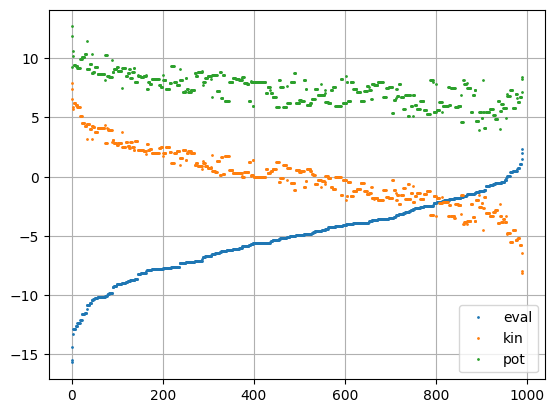

In [5]:
evecs_df.plot(style='.', grid=True, markersize=2)

In [ ]:
k_rank = np.linalg.matrix_rank(model.kinetic_term.toarray())
h_rank = np.linalg.matrix_rank(model.hamiltonian.toarray())
print(k_rank, h_rank, basis.n_states, (basis.n_states - k_rank) / basis.n_states)

In [ ]:
plt.spy(evecs, precision=1e-12, markersize=0.05)
plt.show()

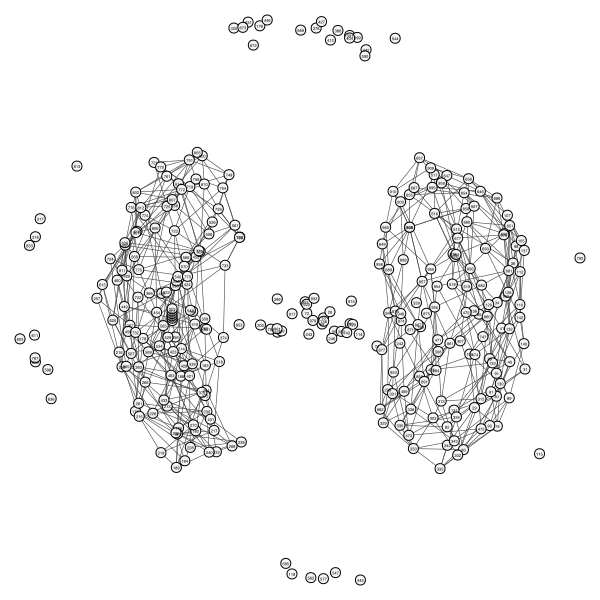

In [18]:
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    # np.where(np.diag(two_steps_mat) == 8)[0],
    # np.where(np.diag(two_steps_mat) == 6)[0],
    # [29, 41, 89, 110, 31, 91, 140, 100]
]
highlight_color = [
    # "aqua",
    # "deepskyblue",
    # "yellowgreen",
    # "tomato",
    # "royalblue"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
sub_ig = ig.induced_subgraph(np.where((np.diag(two_steps_mat) == 8))[0])
igraph.plot(
    sub_ig,
    layout=sub_ig.layout_kamada_kawai(),
    vertex_size=10,
    # vertex_color="orange",
    edge_width=0.6,
    # edge_color="gray"
    vertex_label_size=4,
)

In [22]:
nx.write_gexf(sub_ig.to_networkx(), "data2.gexf")

In [20]:
mat = nx.to_numpy_array(sub_ig.to_networkx()) + 2 * np.eye(sub_ig.vcount())
print(mat.shape[0] - np.linalg.matrix_rank(mat))

6


In [0]:
g = nx.from_numpy_array(-model.kinetic_term)
net = nt.Network(filter_menu=True, select_menu=True, font_color="black")
net.from_nx(g)
for node in net.nodes:
    node["title"] = str(node["id"])
net.show_buttons(filter_=['nodes', 'edges', 'physics'])
net.write_html("nx.html")

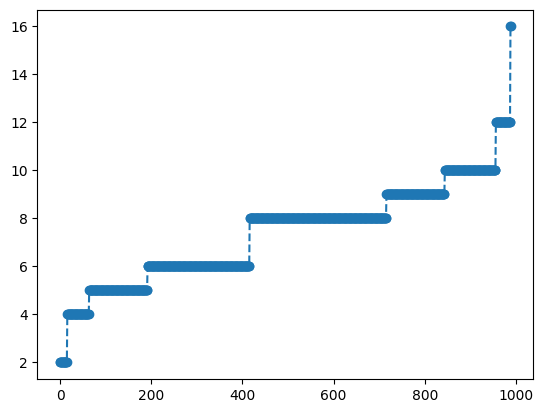

In [9]:
two_steps_mat = np.linalg.matrix_power(model.kinetic_term.toarray(), 2)
sort_idx = np.argsort(np.diag(two_steps_mat))

plt.plot(np.diag(two_steps_mat[sort_idx, :][:, sort_idx]), linestyle="--", marker="o")
plt.show()

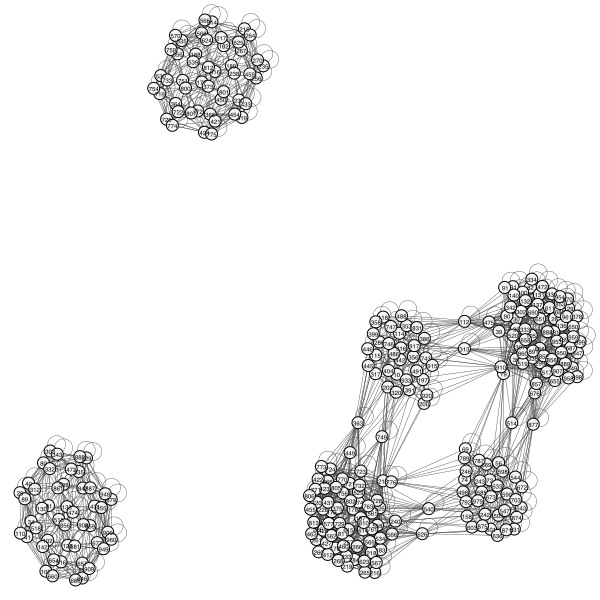

In [12]:
g = nx.from_numpy_array(two_steps_mat)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    # [35,  40,  41,  98, 110, 129, 137, 178, 183, 215, 218, 256, 257,
    #    264, 299, 303, 307, 312, 335, 338, 343, 365, 374, 419, 420, 421,
    #    454, 455, 459, 460, 470, 473, 516, 519, 529, 530, 534, 535, 568,
    #    569, 570, 615, 624, 646, 651, 654, 677, 682, 686, 690, 725, 732,
    #    733, 771, 774, 806, 811, 852, 860, 879, 891, 948, 949, 954],
    # np.where((np.abs(evecs[:, 680]) > 0.04) & (np.abs(evecs[:, 680]) < 0.08))[0],
    # np.where((np.abs(evecs[:, 680]) > 0.08) & (np.abs(evecs[:, 680]) < 0.12))[0],
    # np.where(evecs[:, 680] > 0.12)[0],
    # np.where(evecs[:, 680] < -0.12)[0],
    # np.where(np.abs(evecs[:, 678]) > 0.05)[0],
]
highlight_color = [
    # "aqua",
    # "deepskyblue",
    # "yellowgreen",
    # "tomato",
    # "royalblue"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 8)[0])
igraph.plot(
    sub_ig,
    # layout=sub_ig.layout_kamada_kawai(),
    vertex_size=12,
    # vertex_color="orange",
    edge_width=0.4,
    # edge_color="darkgray",
    vertex_label_size=6,
    inline=True
)

In [13]:
sub_components = sub_ig.connected_components(mode="weak")

for c in sub_components:
    mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
    print(mat.shape[0] - np.linalg.matrix_rank(mat))

20
3
3


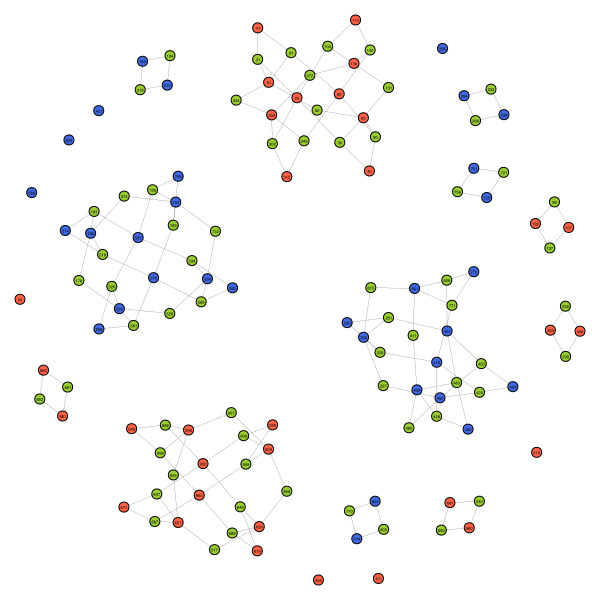

In [35]:
# g = nx.from_numpy_array(two_steps_mat)
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    list(map(int, sub_ig.subgraph(sub_components[0]).vs["label"])),
    list(map(int, sub_ig.subgraph(sub_components[1]).vs["label"])),
    list(map(int, sub_ig.subgraph(sub_components[2]).vs["label"])),
    # np.where(np.diag(two_steps_mat) == 8)[0]
]
highlight_color = [
    "yellowgreen",
    "tomato",
    "royalblue"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
# sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 8)[0])
sub_ig = ig.induced_subgraph(np.where(np.abs(evecs[:, 225]) > 0.05)[0])
igraph.plot(
    sub_ig,
    # layout=ig.layout_kamada_kawai(),
    vertex_size=10,
    # vertex_color="orange",
    edge_width=0.2,
    # edge_color="gray"
    vertex_label_size=4,
)

In [ ]:
sub_components = sub_ig.connected_components(mode="weak")

for c in sub_components:
    mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
    print(mat.shape[0] - np.linalg.matrix_rank(mat))

In [ ]:
sub_sub_ig = sub_ig.induced_subgraph(sub_components[2])
igraph.plot(
    sub_sub_ig,
    layout=sub_sub_ig.layout_kamada_kawai(),
    vertex_size=10,
    # vertex_color="orange",
    edge_width=0.2,
    # edge_color="gray"
    vertex_label_size=4,
)

In [ ]:
net = nt.Network(filter_menu=True, select_menu=True, font_color="black")
net.from_nx(sub_ig.subgraph(sub_components[2]).to_networkx())
for node in net.nodes:
    node["title"] = str(node["id"])
net.show_buttons(filter_=['nodes', 'edges', 'physics'])
net.write_html("nx.html")

In [ ]:
nx.write_gexf(sub_ig.subgraph(sub_components[2]).to_networkx(), "data.gexf")

In [ ]:
np.linalg.eigh(nx.to_numpy_array(sub_ig.subgraph(sub_components[2]).to_networkx()))[0]

In [ ]:
np.linalg.eigh(nx.to_numpy_array(sub_ig.subgraph(sub_components[2]).to_networkx()))[1][:, 22:25]

In [ ]:
entropies = np.asarray([model.entropy(evecs[:, i], 1, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df[entropy_df < 3.5]

In [ ]:
entropy_df.plot(style='o')

array([ 0.05015371, -0.05015371, -0.07862032, -0.07667849,  0.05015371,
        0.10151202, -0.05646437, -0.0677535 , -0.05091633,  0.14543314,
        0.16665718,  0.05091633, -0.22531071,  0.12273606, -0.05091633,
       -0.11212493,  0.11721031, -0.09425746, -0.09393656,  0.12695033,
        0.0531692 , -0.07937424,  0.07465359,  0.07911115, -0.08960445,
        0.07943205, -0.05387878,  0.07937424, -0.05484364, -0.07465359,
        0.10940572,  0.07465359, -0.09577801,  0.05484364, -0.05484364,
        0.1042744 , -0.18984225,  0.07728842,  0.12120954, -0.09725522,
        0.05484364, -0.050123  ,  0.08917207, -0.08992534,  0.050123  ,
       -0.050123  , -0.07937424,  0.07445618, -0.0880402 ,  0.07937424,
        0.050123  , -0.06361881, -0.07465359,  0.08885118,  0.06035328,
       -0.05015371,  0.05091633,  0.05091633, -0.05015371,  0.06035328,
        0.08885118, -0.07465359, -0.06361881,  0.050123  ,  0.07937424,
       -0.0880402 ,  0.07445618, -0.07937424, -0.050123  ,  0.05

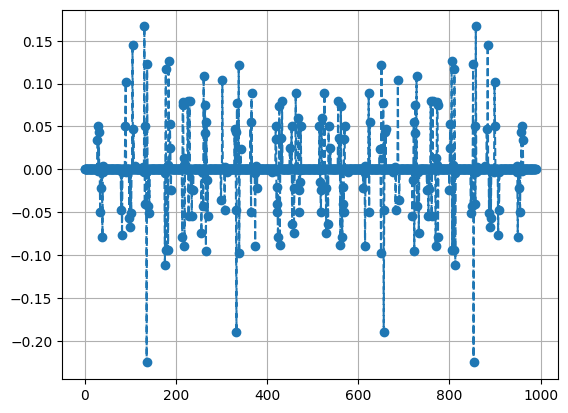

In [10]:
i = 400
plt.plot(evecs[:, i], linestyle='--', marker='o')
plt.grid()
evecs[:, i][np.where(np.abs(evecs[:, i]) > 0.05)[0]]
# np.sign(evecs[:, i][idx])

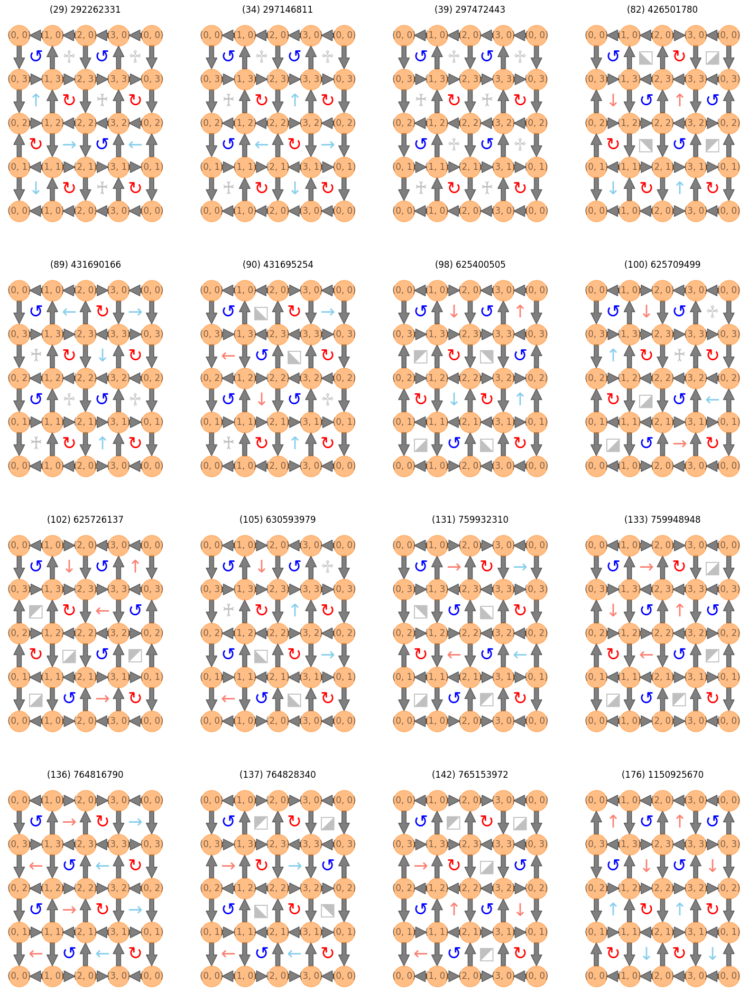

In [6]:
fig, axes = plt.subplots(4, 4, figsize=(18, 24), facecolor="white")
ax = axes.flatten()

# for i, val in enumerate(np.where(np.abs(evecs[:, 246]) > 0.1)[0][-16:]):
for i, val in enumerate(np.where(np.abs(evecs[:, 400]) > 0.05)[0][:16]):
# for i, val in enumerate(np.where(np.abs(evecs[:, 678]) > 0.1)[0][:8]):
# for i, val in enumerate([470, 954, 474, 949]):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[val]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[val]}")

/Users/tandaolin/projects/qlinks/.venv/lib/python3.11/site-packages/scipy/sparse/linalg/_eigen/arpack/arpack.py:1577: RuntimeWarning: k >= N - 1 for N * N square matrix. Attempting to use scipy.linalg.eig instead.
  ret = eigs(A, k, M=M, sigma=sigma, which=which, v0=v0,


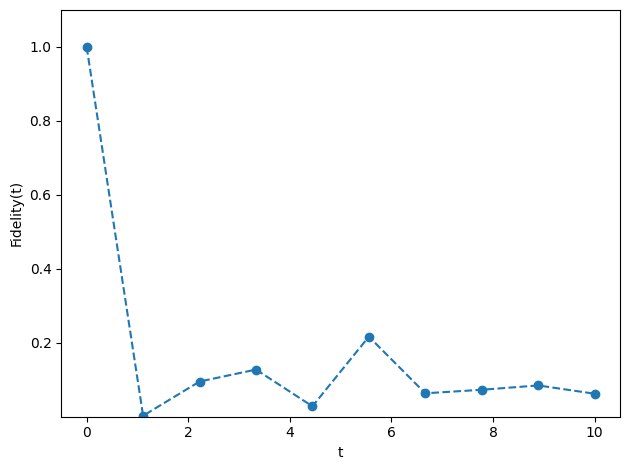

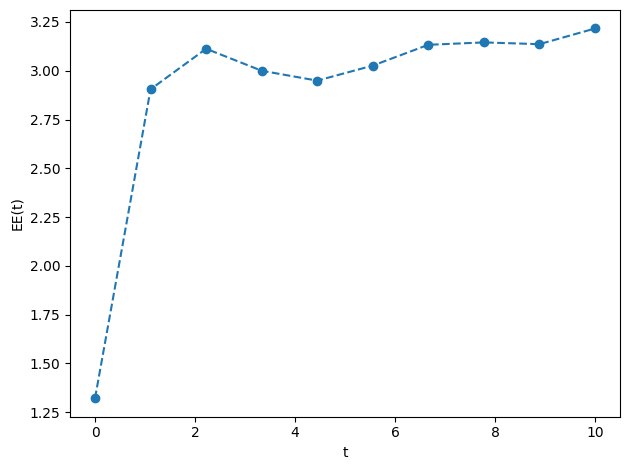

final fidelity = 0.9999999999999993
O_kin @ psi_scar = [0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.35355339 0.         0.35355339 0.         0.70710678
 0.35355339 0.70710678 0.35355339 0.         0.         0.
 0.35355339 0.         0.         1.41421356 0.         0.70710678
 0.35355339 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.70710678 0.         0.70710678 0.         0.
 0.35355339 0.         0.35355339 0.         0.         0.70710678
 0.35355339 0.70710678 0.35355339 0.

In [28]:
coup_j = np.ones((np.prod(model.shape), 1))
# coup_j[0] = 1.05
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
# scar_state[np.array([82, 216, 226, 257, 299, 333, 656, 690, 732, 763, 773, 907]), 0] = np.array([1.,  1.,  1., -1.,  1., -1., -1.,  1., -1.,  1.,  1.,  1.])
# scar_state[np.array([470, 954, 474, 949]), 0] = np.array([1, 1, 1, 1])
scar_state[np.array([29, 31, 41, 89, 91, 100, 110, 140]), 0] = np.array([1, 1, 1, 1, 1, 1, 1, 1])
scar_state /= np.linalg.norm(scar_state)
# scar_state = evecs[:, 678]

start, stop, num = 0, 10, 10
evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=start, stop=stop, num=num)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]
entropy = [model.entropy(evol_state.flatten(), 2, 0) for evol_state in evol_states]

plt.plot(np.linspace(start, stop, num), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

plt.plot(np.linspace(start, stop, num), np.round(entropy, 12), linestyle="--", marker="o")
plt.xlabel("t")
plt.ylabel("EE(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[0], tol=1e-12)
print(f"final fidelity = {fidelity[0]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

# QLM Lattice 6x4

In [ ]:
coup_j, coup_rk = (1, -0.7)  # dfs 3 mins 33 secs
basis, model = setup_link_model(lattice_shape=(6, 4), n_solution=32810, coup_j=coup_j, coup_rk=coup_rk) 

2024-03-12 15:25:50 [deep_first_search.py] INFO: Deep First Search starts.
  0%|          | 0/25622 [00:00<?, ?it/s]                  IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)

 80%|████████  | 166760/207176 [00:00<00:00, 201917475.47it/s]

In [ ]:
# basis.dataframe.to_parquet("qlm_6x4_lattice.parquet", index=False)
basis = ComputationBasis.from_parquet("data/qlm_6x4_lattice.parquet")
coup_j, coup_rk = (1, -0.7)
model = QuantumLinkModel(coup_j, coup_rk, (6, 4), basis)

In [ ]:
evals, evecs = np.load("data/qlm_6x4_coup_j_1_coup_rk_-0.7_eigs.npz").values()

In [ ]:
evecs_df = pd.read_parquet("data/qlm_6x4_coup_j_1_coup_rk_-0.7_eigs.parquet")
evecs_df[evecs_df["kin"].abs() < 1e-12]

In [ ]:
evecs_df[(evecs_df["kin"].abs() < 1e-12) & ((evecs_df["pot"].abs() - 10).abs() < 1e-12)]

In [ ]:
i = 17481
plt.plot(evecs[:, i], linestyle='--', marker='.')
# np.where(np.abs(evecs[:, i]) > 0.04)[0]

In [ ]:
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    # np.where(np.diag(two_steps_mat) == 12)[0],
    # np.where(np.diag(two_steps_mat) == 10)[0],
    # np.where(np.abs(evecs[:, 17479]) > 0.03)[0]
]
highlight_color = [
    # "aqua",
    # "deepskyblue",
    # "yellowgreen",
    # "tomato",
    # "royalblue"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 12)[0])
igraph.plot(
    sub_ig,
    layout=sub_ig.layout_kamada_kawai(),
    vertex_size=4,
    # vertex_color="orange",
    edge_width=0.2,
    edge_color="darkgray",
    vertex_label_size=1,
    inline=True
)

In [ ]:
sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 10)[0])
igraph.plot(
    sub_ig,
    layout=sub_ig.layout_kamada_kawai(),
    vertex_size=4,
    # vertex_color="orange",
    edge_width=0.2,
    edge_color="darkgray",
    vertex_label_size=1,
    inline=True
)

In [ ]:
two_steps_mat = csr_matrix(model.kinetic_term) ** 2
# sort_idx = np.argsort(np.diag(two_steps_mat))

# plt.plot(np.diag(two_steps_mat[sort_idx, :][:, sort_idx]), linestyle="--", marker="o")
# plt.show()
np.unique(two_steps_mat.diagonal())
two_steps_mat = two_steps_mat.toarray()

In [ ]:
g = nx.from_numpy_array(two_steps_mat)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    np.where(np.abs(evecs[:, 17475]) > 0.03)[0]
]
highlight_color = [
    # "aqua",
    # "deepskyblue",
    # "yellowgreen",
    "tomato",
    # "royalblue"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 10)[0])
igraph.plot(
    sub_ig,
    # layout=sub_ig.layout_kamada_kawai(),
    vertex_size=4,
    # vertex_color="orange",
    edge_width=0.2,
    edge_color="darkgray",
    vertex_label_size=1,
    inline=True
)

In [ ]:
sub_components = sub_ig.connected_components(mode="weak")

for c in sub_components:
    mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
    print(mat.shape[0] - np.linalg.matrix_rank(mat))
    
print([len(c) for c in sub_components])

In [ ]:
g = nx.from_numpy_array(-model.kinetic_term)
ig = igraph.Graph.from_networkx(g)
ig.vs["label"] = [str(i) for i in range(ig.vcount())]
color = ["whitesmoke" for i in range(ig.vcount())]
highlight = [
    list(map(int, sub_ig.subgraph(sub_components[0]).vs["label"])),
    list(map(int, sub_ig.subgraph(sub_components[1]).vs["label"])),
    list(map(int, sub_ig.subgraph(sub_components[2]).vs["label"])),
    # np.where(np.diag(two_steps_mat) == 10)[0]
]
highlight_color = [
    "tomato",
    "yellowgreen",
    "royalblue"
]
for i, nodes in enumerate(highlight):
    for node in nodes:
        color[node] = highlight_color[i]
ig.vs["color"] = color
sub_ig = ig.induced_subgraph(np.where(np.diag(two_steps_mat) == 10)[0])
igraph.plot(
    sub_ig,
    # layout=sub_ig.layout_kamada_kawai(),
    vertex_size=4,
    # vertex_color="orange",
    edge_width=0.2,
    # edge_color="gray"
    vertex_label_size=1,
)

In [ ]:
sub_components = sub_ig.connected_components(mode="weak")

nullity = []
for c in sub_components:
    if len(c) > 1:
        mat = nx.to_numpy_array(sub_ig.subgraph(c).to_networkx())
        nullity.append(mat.shape[0] - np.linalg.matrix_rank(mat))

print(np.unique(nullity, return_counts=True))
print(np.unique([len(c) for c in sub_components], return_counts=True))

# QLM Lattice 6x6

In [3]:
basis = ComputationBasis.from_parquet("data/qlm_6x6_lattice.parquet")
coup_j, coup_rk = (1, -0.7)
# model = QuantumLinkModel(coup_j, coup_rk, (6, 6), basis)

In [28]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

In [6]:
basis.dataframe.tail(10)

,0,1,2,3,4,5,6,7,8,9,...,62,63,64,65,66,67,68,69,70,71
4698149148010938123594,1,1,1,1,1,1,1,0,1,0,...,0,1,0,1,0,0,1,0,1,0
4698149148010938144066,1,1,1,1,1,1,1,0,1,0,...,0,1,0,1,0,0,0,0,1,0
4698149148010942342464,1,1,1,1,1,1,1,0,1,0,...,0,1,0,1,0,0,0,0,0,0
4698149148011021997378,1,1,1,1,1,1,1,0,1,0,...,0,1,0,1,0,0,0,0,1,0
4698149148011026195776,1,1,1,1,1,1,1,0,1,0,...,0,1,0,1,0,0,0,0,0,0
4698149148028222833984,1,1,1,1,1,1,1,0,1,0,...,0,1,0,1,0,0,0,0,0,0
4698149148354485163330,1,1,1,1,1,1,1,0,1,0,...,0,1,0,1,0,0,0,0,1,0
4698149148354489361728,1,1,1,1,1,1,1,0,1,0,...,0,1,0,1,0,0,0,0,0,0
4698149148371685999936,1,1,1,1,1,1,1,0,1,0,...,0,1,0,1,0,0,0,0,0,0
4698149218809116099904,1,1,1,1,1,1,1,0,1,0,...,0,1,0,1,0,0,0,0,0,0


In [9]:
basis.dataframe.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5482716 entries, 24217264060529113791 to 4698149218809116099904
Data columns (total 72 columns):
 #   Column  Dtype
---  ------  -----
 0   0       int64
 1   1       int64
 2   2       int64
 3   3       int64
 4   4       int64
 5   5       int64
 6   6       int64
 7   7       int64
 8   8       int64
 9   9       int64
 10  10      int64
 11  11      int64
 12  12      int64
 13  13      int64
 14  14      int64
 15  15      int64
 16  16      int64
 17  17      int64
 18  18      int64
 19  19      int64
 20  20      int64
 21  21      int64
 22  22      int64
 23  23      int64
 24  24      int64
 25  25      int64
 26  26      int64
 27  27      int64
 28  28      int64
 29  29      int64
 30  30      int64
 31  31      int64
 32  32      int64
 33  33      int64
 34  34      int64
 35  35      int64
 36  36      int64
 37  37      int64
 38  38      int64
 39  39      int64
 40  40      int64
 41  41      int64
 42  42      int64
 43

In [10]:
model = QuantumLinkModel(coup_j, coup_rk, (6, 6), basis)

InvalidOperationError: Basis is not closure under the plaquette operator.